# AIRS Maps


## Dr. Von Walden's original code

In [1]:
#need this to make plots show up
%matplotlib inline

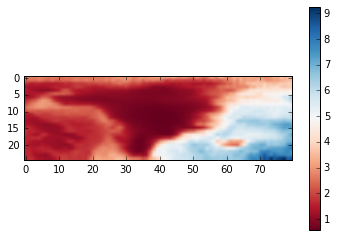

In [2]:
"""
Created on Wed Jan 13 16:49:41 2016

@author: Von P. Walden
         Washington State University
"""

from netCDF4 import Dataset
from pylab import *
# Daily data
# airs = Dataset('http://acdisc.sci.gsfc.nasa.gov:80/opendap/Aqua_AIRS_Level3/AIRX3STD.006/2002/AIRS.2002.08.31.L3.RetStd001.v6.0.9.0.G13208034313.hdf')

# 8-day composites
airs = Dataset('http://acdisc.sci.gsfc.nasa.gov/opendap/hyrax/Aqua_AIRS_Level3/AIRX3ST8.006/2015/AIRS.2015.01.08.L3.RetStd008.v6.0.11.0.G15041142214.hdf')

#for v in airs.variables:
    #print(v)

lat = airs.variables['Latitude'][...]
lon = airs.variables['Longitude'][...]

# For Greenland
ilat = find( (lat>=60) & (lat<=85) )
ilon = find( (lon<=0) & (lon>=-80) )

# Plot data.
figure()
imshow(airs.variables['TotH2OVap_TqJ_D'][ilat,ilon])
set_cmap(cm.RdBu)
colorbar()

## 10 June 2015


### Making some maps of the region

In [3]:
plt.rcParams['figure.figsize'] = (25, 10)

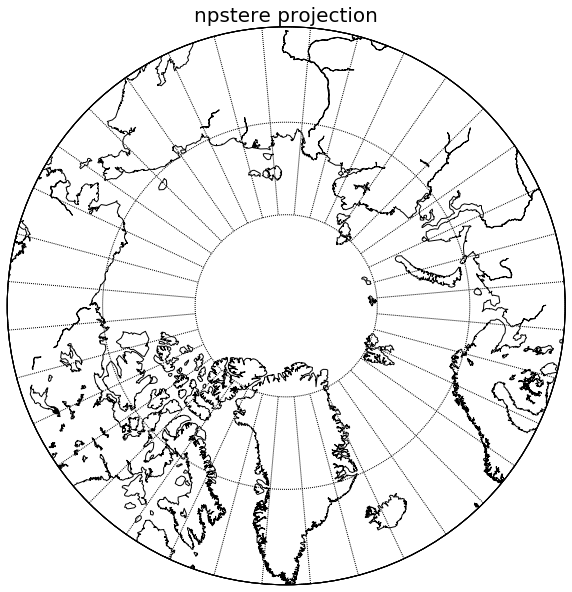

In [4]:
import numpy as np
import pandas as pd
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt

m = Basemap(resolution='l',projection='npstere',boundinglat=60.,lon_0=-45., round=True)
m.drawmapboundary()
m.drawcoastlines()
parallels=np.arange(60, 81, 10)
m.drawparallels(parallels)
meridians = np.arange(0.,360.,10.)
m.drawmeridians(meridians)
plt.title('npstere projection', fontsize=20)

plt.show()

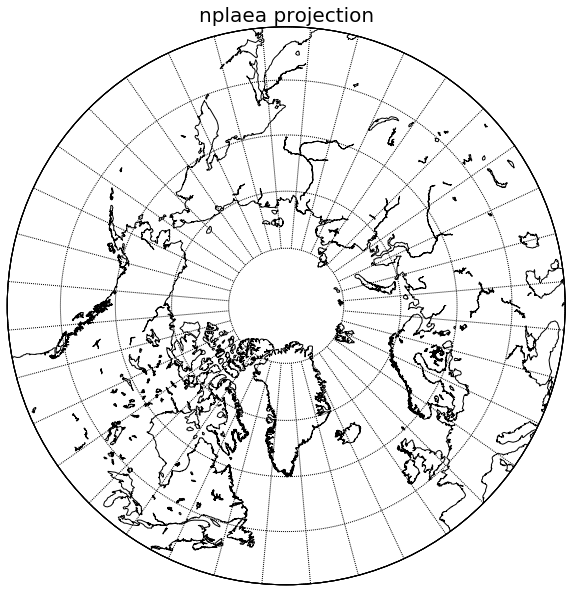

In [5]:
import numpy as np
import pandas as pd
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt

m = Basemap(resolution='l',projection='nplaea',boundinglat=40.,lon_0=-45., round=True)
m.drawmapboundary()
m.drawcoastlines()
parallels=np.arange(40, 81, 10)
m.drawparallels(parallels)
meridians = np.arange(0.,360.,10.)
m.drawmeridians(meridians)
plt.title('nplaea projection', fontsize=20)

plt.show()

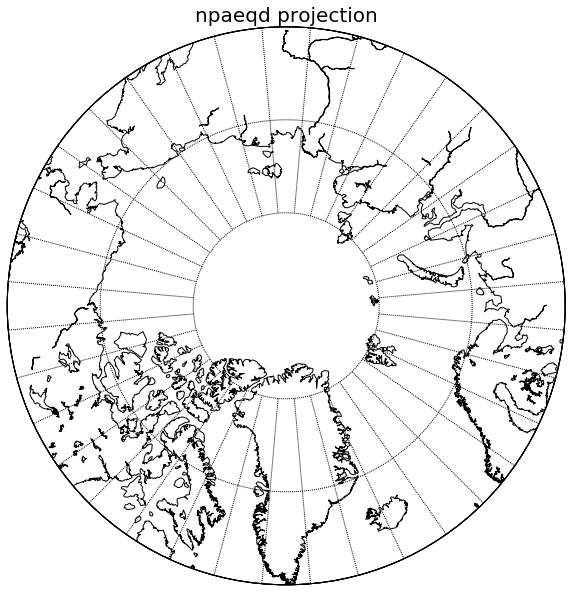

In [6]:
import numpy as np
import pandas as pd
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt

m = Basemap(resolution='l',projection='npaeqd',boundinglat=60.,lon_0=-45., round=True)
m.drawmapboundary()
m.drawcoastlines()
parallels=np.arange(60, 81, 10)
m.drawparallels(parallels)
meridians = np.arange(0.,360.,10.)
m.drawmeridians(meridians)
plt.title('npaeqd projection', fontsize=20)

plt.show()

## 13 June 2016


### Water vapor plots

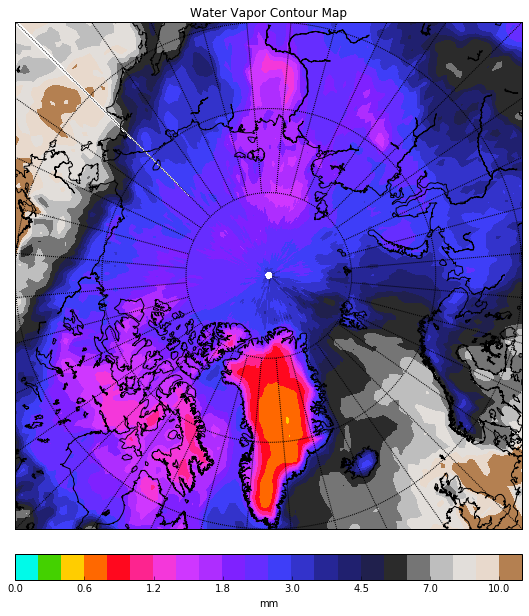

In [7]:
# -*- coding: utf-8 -*-
"""
Created on Mon Jun 13 11:19:34 2016

@author: pstar
"""

from netCDF4 import Dataset
from mpl_toolkits.basemap import Basemap, cm
import matplotlib.pyplot as plt
import numpy as np

# Daily data
# airs = Dataset('http://acdisc.sci.gsfc.nasa.gov:80/opendap/Aqua_AIRS_Level3/AIRX3STD.006/2002/AIRS.2002.08.31.L3.RetStd001.v6.0.9.0.G13208034313.hdf')

# 8-day composites
airs = Dataset('http://acdisc.sci.gsfc.nasa.gov/opendap/hyrax/Aqua_AIRS_Level3/AIRX3ST8.006/2015/AIRS.2015.01.08.L3.RetStd008.v6.0.11.0.G15041142214.hdf')

#for v in airs.variables:
    #print(v)

lats = airs.variables['Latitude'][:] 
lons = airs.variables['Longitude'][:]

vap = airs.variables['TotH2OVap_TqJ_D'][...]

# Create a north pole map.
plt.figure()
m = Basemap(resolution='l',projection='npstere',boundinglat=60.,lon_0=-45.)
m.drawmapboundary()
m.drawcoastlines()
parallels = np.arange(60.,81,10.)
meridians = np.arange(0.,360.,10.)
m.drawparallels(parallels)
m.drawmeridians(meridians)
x,y=np.meshgrid(lons, lats)
px,py=m(x,y)

            # draw filled contours.
clevs = [0,.2,.4,.6,.8,1.,1.2,1.4,1.6,1.8,2.,2.5,3.,3.5,4.,4.5,5.,6.,7.,8.,9.,10., 20.]
cs = m.contourf(px,py,vap,clevs,cmap=cm.s3pcpn)
# add colorbar.
cbar = m.colorbar(cs,location='bottom',pad="5%")
cbar.set_label('mm')
# add title
plt.title('Water Vapor Contour Map')
plt.show()


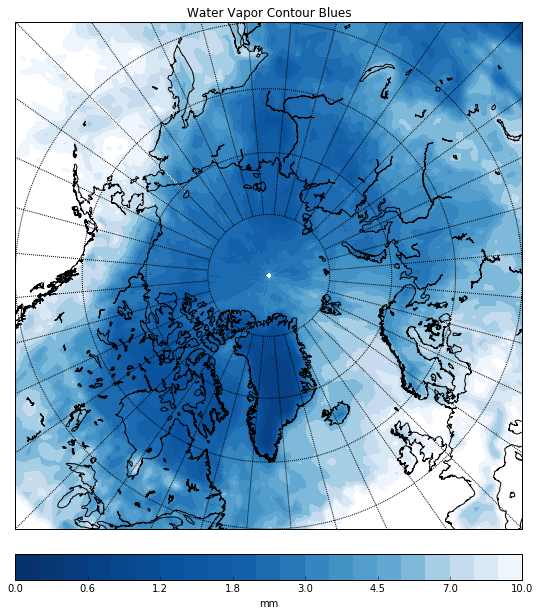

In [8]:
# -*- coding: utf-8 -*-
"""
Created on Mon Jun 13 11:19:34 2016

@author: pstar
"""

from netCDF4 import Dataset
from mpl_toolkits.basemap import Basemap, cm
import matplotlib.pyplot as plt
import numpy as np

# Daily data
# airs = Dataset('http://acdisc.sci.gsfc.nasa.gov:80/opendap/Aqua_AIRS_Level3/AIRX3STD.006/2002/AIRS.2002.08.31.L3.RetStd001.v6.0.9.0.G13208034313.hdf')

# 8-day composites
airs = Dataset('http://acdisc.sci.gsfc.nasa.gov/opendap/hyrax/Aqua_AIRS_Level3/AIRX3ST8.006/2015/AIRS.2015.01.08.L3.RetStd008.v6.0.11.0.G15041142214.hdf')

#for v in airs.variables:
    #print(v)

lats = airs.variables['Latitude'][:] 
lons = airs.variables['Longitude'][:]

vap = airs.variables['TotH2OVap_TqJ_D'][...]

# Create a nifty map.
plt.figure()
#changed projection from 'ortho' to 'npstere' 
#changed lon_0 from 0. to -45.
#changed bounding parallel to 40.-p.star
m = Basemap(resolution='l',projection='npstere',boundinglat=50.,lon_0=-45.)
m.drawmapboundary()
m.drawcoastlines()
parallels = np.arange(50.,81,10.)
meridians = np.arange(0.,360.,10.)
m.drawparallels(parallels)
m.drawmeridians(meridians)
x,y=np.meshgrid(lons, lats)
px,py=m(x,y)

            # draw filled contours.
clevs = [0,.2,.4,.6,.8,1.,1.2,1.4,1.6,1.8,2.,2.5,3.,3.5,4.,4.5,5.,6.,7.,8.,9., 10.]
cs = m.contourf(px,py,vap,clevs,cmap=plt.cm.Blues_r)
# add colorbar.
cbar = m.colorbar(cs,location='bottom',pad="5%")
cbar.set_label('mm')
# add title
plt.title('Water Vapor Contour Blues')
plt.show()


### Problem: 
Currently the main issue is colors. Need to find a good color scheme that sufficiently shows distinction between contours < 2. 

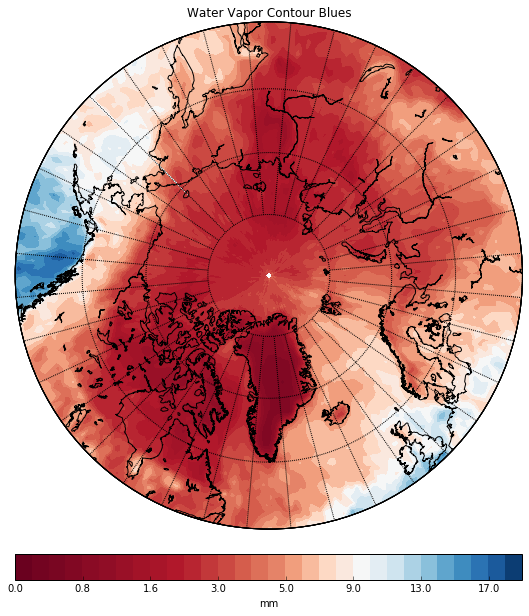

In [9]:
"""
Created on Mon Jun 13 11:19:34 2016

@author: pstar
"""

from netCDF4 import Dataset
from mpl_toolkits.basemap import Basemap, cm
import matplotlib.pyplot as plt
import numpy as np

# Daily data
# airs = Dataset('http://acdisc.sci.gsfc.nasa.gov:80/opendap/Aqua_AIRS_Level3/AIRX3STD.006/2002/AIRS.2002.08.31.L3.RetStd001.v6.0.9.0.G13208034313.hdf')

# 8-day composites
airs = Dataset('http://acdisc.sci.gsfc.nasa.gov/opendap/hyrax/Aqua_AIRS_Level3/AIRX3ST8.006/2015/AIRS.2015.01.08.L3.RetStd008.v6.0.11.0.G15041142214.hdf')

#for v in airs.variables:
    #print(v)

lats = airs.variables['Latitude'][:] 
lons = airs.variables['Longitude'][:]

vap = airs.variables['TotH2OVap_TqJ_D'][...]

# Create a north pole map.
plt.figure()
m = Basemap(resolution='l',projection='npstere',boundinglat=50.,lon_0=-45., round=True)
m.drawmapboundary()
m.drawcoastlines()
parallels = np.arange(50.,81,10.)
meridians = np.arange(0.,360.,10.)
m.drawparallels(parallels)
m.drawmeridians(meridians)
x,y=np.meshgrid(lons, lats)
px,py=m(x,y)

            # draw filled contours.
clevs = [0,.2,.4,.6,.8,1.,1.2,1.4,1.6,1.8,2.,2.5,3.,3.5,4.,4.5,5.,6.,7.,8.,9., 10., 11., 12., 13., 14., 15., 16., 17., 18., 19.]
cs = m.contourf(px,py,vap,clevs,cmap=plt.cm.RdBu)
# add colorbar.
cbar = m.colorbar(cs,location='bottom',pad="5%")
cbar.set_label('mm')
# add title
plt.title('Water Vapor Contour Blues')
plt.show()

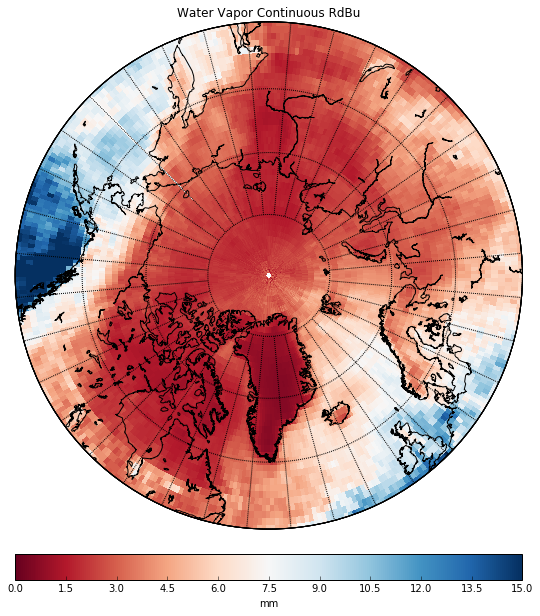

In [10]:
"""
Created on Mon Jun 13 14:30:20 2016

@author: pstar
"""

"""
Created on Mon Jun 13 11:19:34 2016

@author: pstar
"""

from netCDF4 import Dataset
from mpl_toolkits.basemap import Basemap, cm
import matplotlib.pyplot as plt
import numpy as np

#taken from airsDataExample.py from Dr. Von Walden
# Daily data
# airs = Dataset('http://acdisc.sci.gsfc.nasa.gov:80/opendap/Aqua_AIRS_Level3/AIRX3STD.006/2002/AIRS.2002.08.31.L3.RetStd001.v6.0.9.0.G13208034313.hdf')

# 8-day composites
airs = Dataset('http://acdisc.sci.gsfc.nasa.gov/opendap/hyrax/Aqua_AIRS_Level3/AIRX3ST8.006/2015/AIRS.2015.01.08.L3.RetStd008.v6.0.11.0.G15041142214.hdf')

#for v in airs.variables:
    #print(v)
lats = airs.variables['Latitude'][:] 
lons = airs.variables['Longitude'][:]
#end copy from airsDataExample.py

vap = airs.variables['TotH2OVap_TqJ_D'][...]

# Make a north pole basemap
plt.figure()
m = Basemap(resolution='l',projection='npstere',boundinglat=50.,lon_0=-45., round=True)
m.drawmapboundary()
m.drawcoastlines()
parallels = np.arange(50.,81,10.)
meridians = np.arange(0.,360.,10.)
m.drawparallels(parallels)
m.drawmeridians(meridians)
x,y=np.meshgrid(lons, lats)
px,py=m(x,y)

# draw filled contours.
#clevs = [0,.2,.4,.6,.8,1.,1.2,1.4,1.6,1.8,2.,2.5,3.,3.5,4.,4.5,5.,6.,7.,8.,9.]
cs = m.pcolormesh(px,py,vap,vmin=0., vmax=15., cmap=plt.cm.RdBu)
# add colorbar.
cbar = m.colorbar(cs,location='bottom',pad="5%")
cbar.set_label('mm')
# add title
plt.title('Water Vapor Continuous RdBu')
plt.show()


## 14 June 2016

### Sent images to Shima and Sarah for feedback

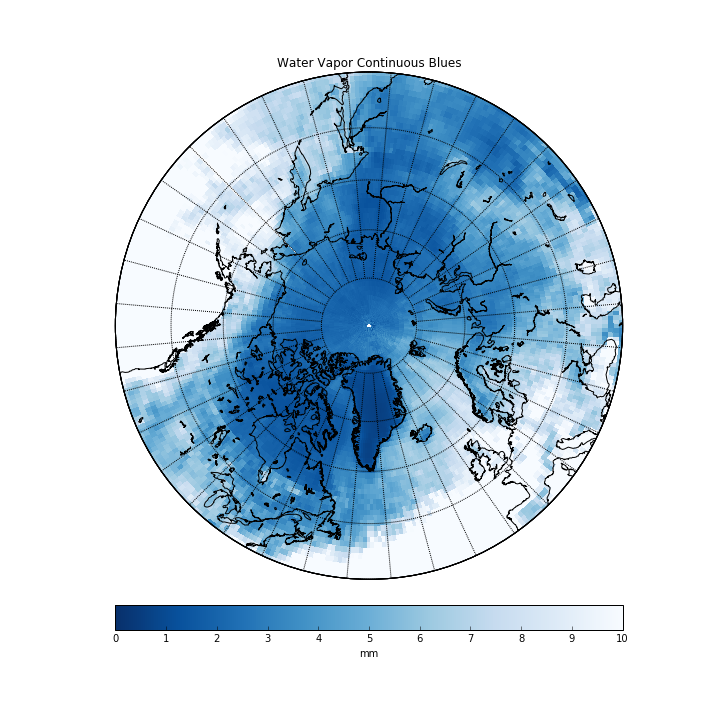

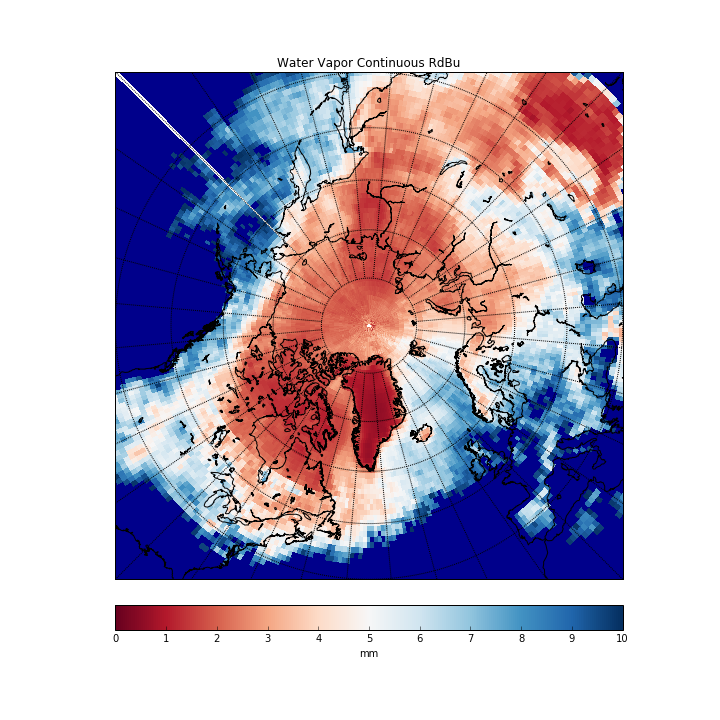

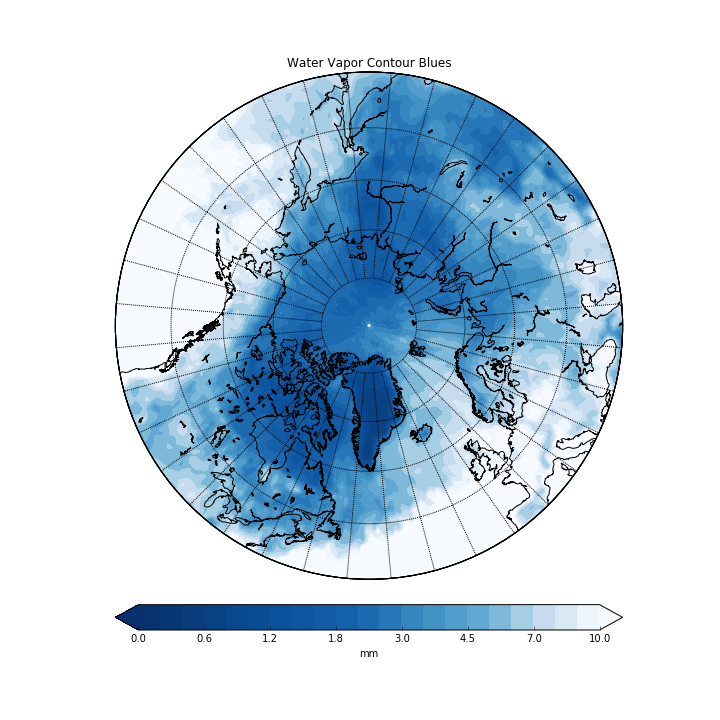

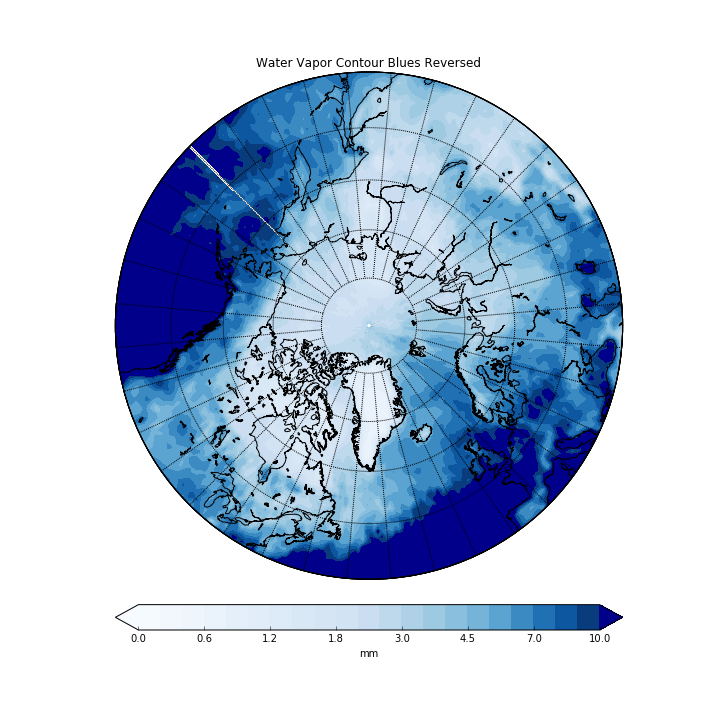

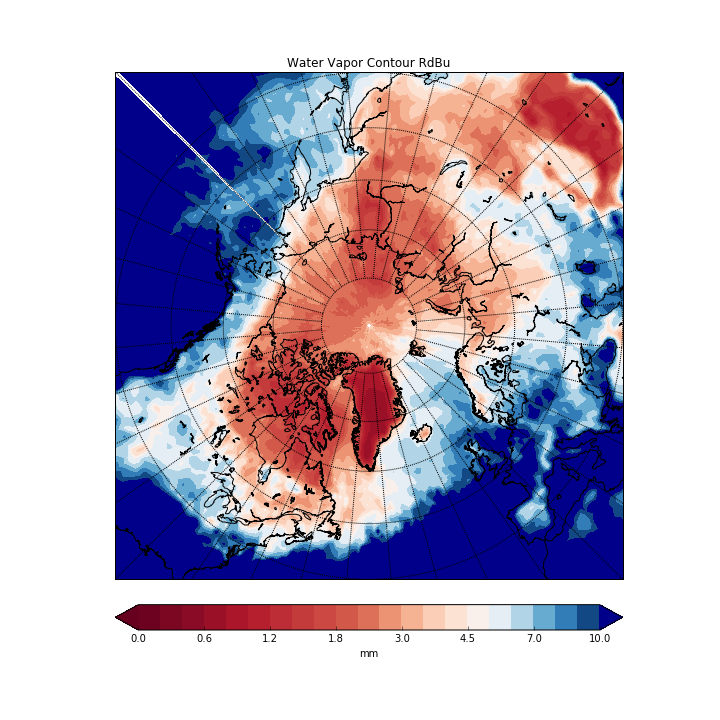

In [3]:
from IPython.display import Image, display
directory='/Users/pstar/Desktop/WSU REU/Project/AIRSplots/'
images=[directory+'WaterVaporContinuousBlues.png', directory+'WaterVaporContinuousRdBu.png', directory+'WaterVaporContoursBlues.png', directory+'WaterVaporContoursBluesReversed.png', directory+'WaterVaporContoursRdBu.png']
for imagename in images:
    display(Image(filename=imagename))
 

### Used Link Grabber for Chrome to start creating text files of AIRS data links.
https://chrome.google.com/webstore/detail/link-grabber/caodelkhipncidmoebgbbeemedohcdma?hl=en-US

## 15 June 2016

### Sent images to Sarah and Shima for feedback.
These are zoomed in so that the bounding latitude is 60 degrees. I also used colormaps that are relatively friendly to common forms of colorblindness, convert nicely to grayscale, and are perceptually uniform. https://bids.github.io/colormap/

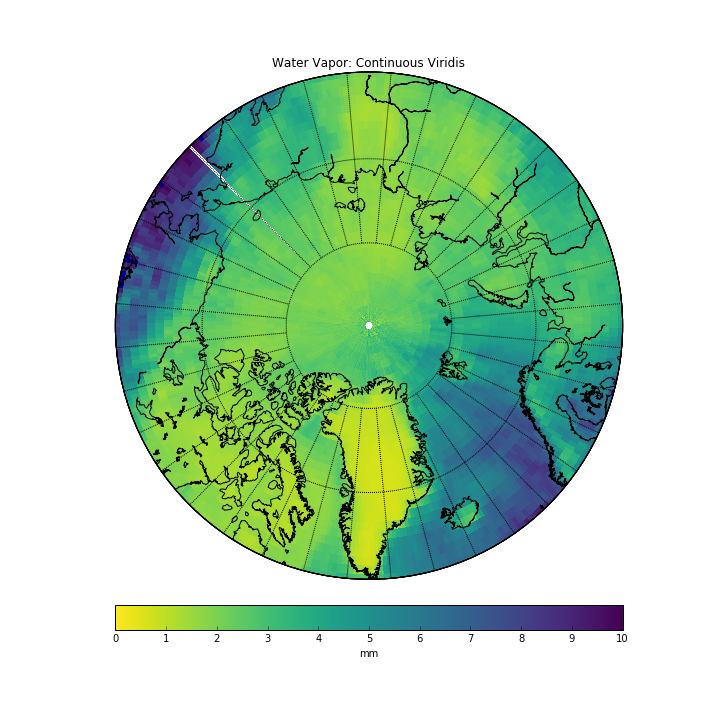

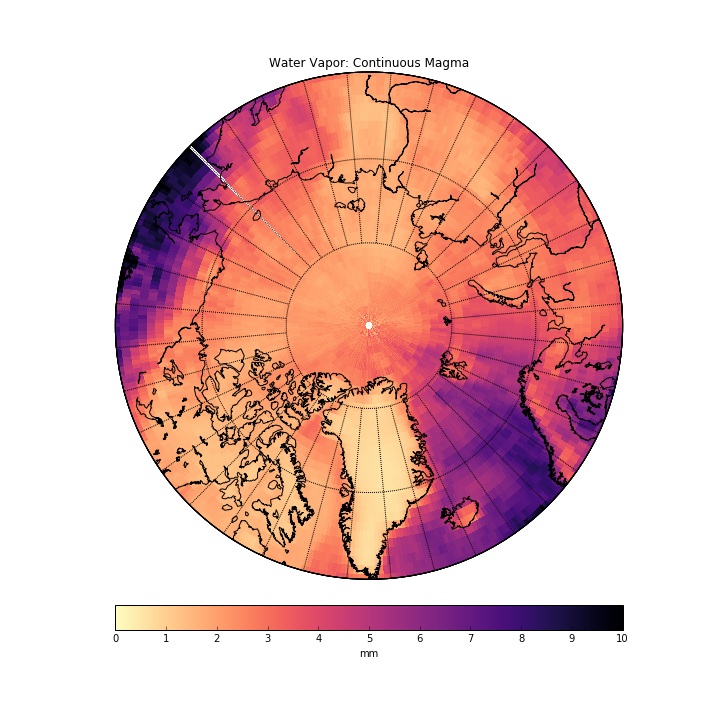

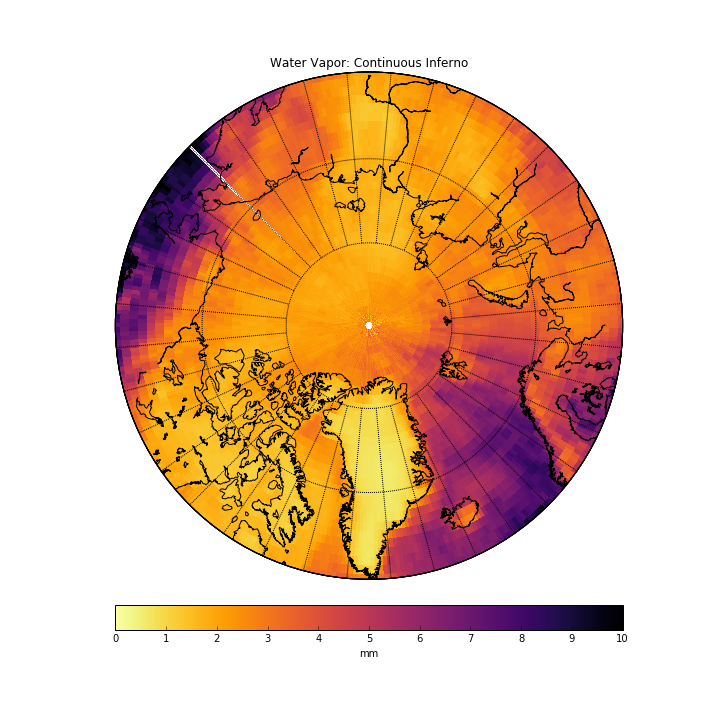

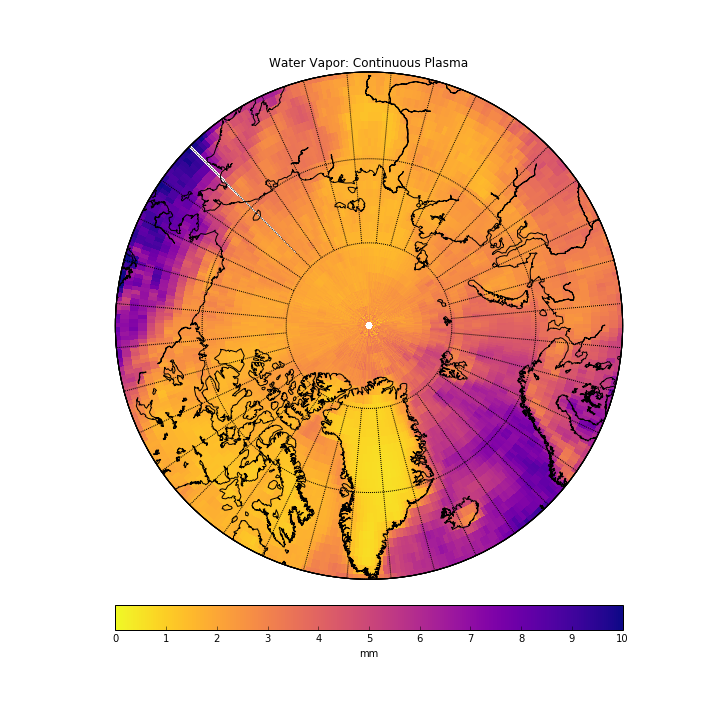

In [5]:
from IPython.display import Image, display
directory='/Users/pstar/Desktop/WSU REU/Project/AIRSplots/'
images=[directory+'WaterVaporContinuousViridis.png', directory+'WaterVaporContinuousMagma.png', directory+'WaterVaporContinuousInferno.png', directory+'WaterVaporContinuousPlasma.png']
for imagename in images:
    display(Image(filename=imagename))

### Finished code for AIRS water vapor plotting!
Shima helped me to slice the hdf text lines to get the date. 

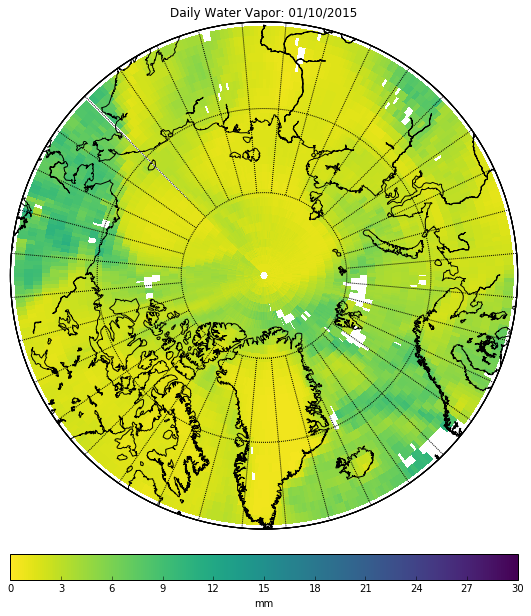

In [8]:
# -*- coding: utf-8 -*-
"""
Created on Wed Jun 15 15:25:40 2016

@author: pstar
"""

#This code takes in a text file of hdf links. I used Link Grabber on Chrome
#to pull the links from http://acdisc.sci.gsfc.nasa.gov/opendap/hyrax/Aqua_AIRS_Level3/AIRX3ST8.006/
#for 8-day composites and from http://acdisc.sci.gsfc.nasa.gov:80/opendap/Aqua_AIRS_Level3/AIRX3STD.006/
#for daily data. The code will read through the file and plot water vapor column
#depth. 

from netCDF4 import Dataset
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
import numpy as np
from pylab import rcParams
rcParams['figure.figsize'] = 10, 10

#set the directory where text files are located
directory='/Users/pstar/Desktop/WSU REU/Project/AIRSdata/'
#open a text file
file = open(directory+'AIRStest.txt', 'r')

for line in file:
    #access data
    airs=Dataset(line)
    #pull the date out of file name
    date=line.split('/')
    date=date[8]
    date=date.split('.')
    #write date as month/day/year
    figDate=date[2]+'/'+date[3]+'/'+date[1]
    #remove slashes for saving file; otherwise computer gets confused
    fileDate=date[2]+date[3]+date[1]
    
    lats = airs.variables['Latitude'][:] 
    lons = airs.variables['Longitude'][:]
    #slice the variables to the required latitude
    latbounds=[60, 90]
    lat_index = np.where((lats >= latbounds[0]) & (lats <= latbounds[1]))
    newLats=lats[lat_index]
    vap = airs.variables['TotH2OVap_TqJ_D'][lat_index]
    
    # Make a north pole basemap
    m = Basemap(resolution='l',projection='npstere',boundinglat=60.,lon_0=-45., round=True)
    m.drawmapboundary()
    m.drawcoastlines()
    parallels = np.arange(60.,81,10.)
    meridians = np.arange(0.,360.,10.)
    m.drawparallels(parallels)
    m.drawmeridians(meridians)
    x,y=np.meshgrid(lons, newLats)
    px,py=m(x,y)
    
    #plot latitude and longitude vs water vapor
    #color options: viridis_r, magma_r, plasma_r, inferno_r
    cs = m.pcolormesh(px,py,vap,vmin=0, vmax=30,cmap=plt.cm.viridis_r)
    
    # add colorbar.
    cbar = m.colorbar(cs,location='bottom',pad="5%")
    cbar.set_label('mm')
    # add title: 'Daily Water Vapor' or '8-Day Composite Water Vapor'
    plt.title('Daily Water Vapor: '+figDate)
    plt.savefig('/Users/pstar/Desktop/WSU REU/Project/AIRSplots/'+fileDate+'.png')
    #plt.show()

Plotted 8-day composites as well as daily water vapor for N-ICE time period: January-June 2015.

Link for back trajectory overlap: http://stackoverflow.com/questions/8850142/matplotlib-overlapping-annotations

## 16 June 2016

### Back Trajectories

Worked on making back trajectory plots legible. Tried moving labels around but the plots for different heights have so much overlap that they are hard to distinguish. My idea now is to make subplots that show the different heights separately. Met with Sarah and the idea is that I will make 5 subplots which will include one large plot that displays water vapor as well as all trajectories superimposed, and four subplots each displaying the trajectory for a specific height.

### Dr. Walden's Original Plot

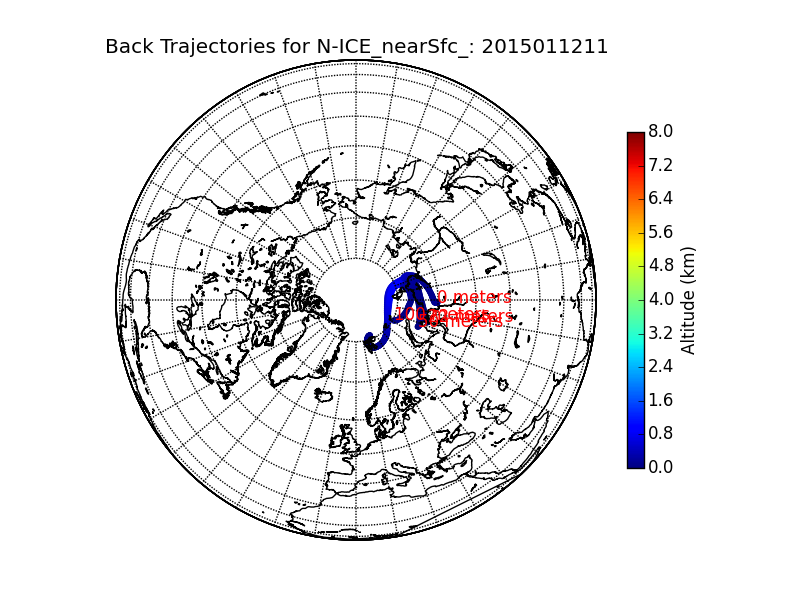

In [2]:
from IPython.display import Image, display
display(Image('/Users/pstar/Desktop/WSU REU/Project/N-ICE/plots/N-ICE_nearSfc_2015011211.png'))

### Subplot example

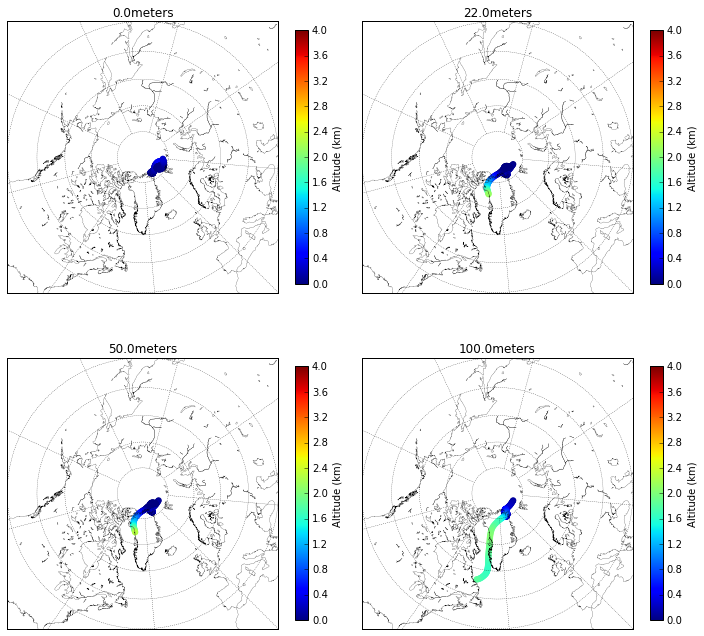

In [3]:
"""
Created on Thu Jun 16 09:35:46 2016

@author: pstar
"""

directory='/Users/pstar/Desktop/WSU REU/Project/N-ICE/HysplitData/'
plotDirectory='/Users/pstar/Desktop/WSU REU/Project/N-ICE/pyxPlots/'

from mpl_toolkits.basemap import Basemap
import numpy as np
import matplotlib.pyplot as plt

from pylab import rcParams
rcParams['figure.figsize'] = 10, 10

# Determine the number of back trajectories to read.
f = open(directory+'N-ICE_nearSfc_2015012223.trj', 'r')
[f.readline() for i in np.arange(4)] # skip 1st four lines.
N = int(f.readline().split()[0])

# Read in the trajectory data and create a data frame.
backtraj = np.loadtxt(directory+'N-ICE_nearSfc_2015012223.trj',skiprows=6+N)
            
# Create a nifty map.
fig=plt.figure()

# ....Plot each back trajectory
for i in np.arange(N):
    ax=fig.add_subplot(2, 2, i+1)
    m = Basemap(resolution='l',projection='npstere',boundinglat=40.,lon_0=-45.)
    m.drawmapboundary()
    m.drawcoastlines(linewidth=0.2)
    parallels = np.arange(40.,90,10.)
    meridians = np.arange(0.,360.,40.)
    m.drawparallels(parallels, linewidth=.3)
    m.drawmeridians(meridians, linewidth=.3)
    lon = backtraj[i::N,10]
    lat = backtraj[i::N, 9]
    alt = backtraj[i::N,11]
    x, y = m(lon, lat)
    #changed vmax=8 to vmax=4, to show better scale ~p.star
    cm=m.scatter(x, y, c=alt/1000., linewidths=0, vmin=0., vmax=4., s=40)
    
# ....Annotate plot.
    cb=plt.colorbar(shrink=0.7)
    cb.set_label('Altitude (km)')
    ax.set_title(str(alt[0])+'meters')
plt.tight_layout()
#fig.set_title('Back Trajectories for: N-ICE_nearSfc_2015012223' )
# ....Save plot.
#plt.savefig(plotDirectory+'N-ICE_nearSfc_2015011211'+'.png')
#plt.close('all')

Ran subplots for all the back trajectory files to see if there is a noticable difference between 22.0 and 50.0 meters

### To do:
    Superimpose backtrajectories onto water vapor
    Set up a search to find the appropriate back trajectory file to superimpose
    Create 5-subplot composition

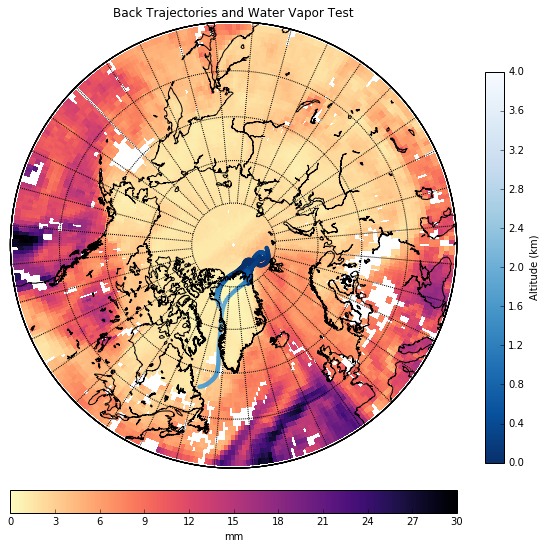

In [26]:
"""
Created on Thu Jun 16 12:35:51 2016

@author: pstar
"""
from netCDF4 import Dataset
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
import numpy as np
from pylab import rcParams
rcParams['figure.figsize'] = 10, 10

directory='/Users/pstar/Desktop/WSU REU/Project/N-ICE/HysplitData/'
plotDirectory='/Users/pstar/Desktop/WSU REU/Project/BackTraj/BackTrajSubPlots/'
backTrajDirectory='/Users/pstar/Desktop/WSU REU/Project/BackTraj/'
#set the directory where text files are located
airsDirectory='/Users/pstar/Desktop/WSU REU/Project/AIRSdata/'
#open a text file
file = open(airsDirectory+'AIRStest.txt', 'r')

for line in file:
    #access data
    airs=Dataset(line)
    #pull the date out of file name
    date=line.split('/')
    date=date[8]
    date=date.split('.')
    #write date as month/day/year
    figDate=date[2]+'/'+date[3]+'/'+date[1]
    #remove slashes for saving file; otherwise computer gets confused
    fileDate=date[2]+date[3]+date[1]
    
#plot water vapor    
    
    lats = airs.variables['Latitude'][:] 
    lons = airs.variables['Longitude'][:]
    #slice the variables to the required latitude
    latbounds=[40, 90]
    lat_index = np.where((lats >= latbounds[0]) & (lats <= latbounds[1]))
    newLats=lats[lat_index]
    vap = airs.variables['TotH2OVap_TqJ_D'][lat_index]
    
    # Make a north pole basemap
    m = Basemap(resolution='l',projection='npstere',boundinglat=40.,lon_0=-45., round=True)
    m.drawmapboundary()
    m.drawcoastlines()
    parallels = np.arange(40.,81,10.)
    meridians = np.arange(0.,360.,10.)
    m.drawparallels(parallels)
    m.drawmeridians(meridians)
    x,y=np.meshgrid(lons, newLats)
    px,py=m(x,y)
    
    #plot latitude and longitude vs water vapor
    #color options: viridis_r, magma_r, plasma_r, inferno_r
    cs=m.pcolormesh(px,py,vap,vmin=0, vmax=30,cmap=plt.cm.magma_r)
    
    # add colorbar.
    cbar = m.colorbar(location='bottom',pad="5%")
    cbar.set_label('mm')
    # add title: 'Daily Water Vapor' or '8-Day Composite Water Vapor'
    plt.title('Daily Water Vapor: '+figDate)
 
#plot back trajectory

    # Determine the number of back trajectories to read.
    f = open(directory+'N-ICE_nearSfc_2015012223.trj', 'r')
    [f.readline() for i in np.arange(4)] # skip 1st four lines.
    N = int(f.readline().split()[0])
    
    # Read in the trajectory data and create a data frame.
    backtraj = np.loadtxt(directory+'N-ICE_nearSfc_2015012223.trj',skiprows=6+N)
                
    
    # Plot each back trajectory onto water vapor map
    for i in np.arange(N):
        lon = backtraj[i::N,10]
        lat = backtraj[i::N, 9]
        alt = backtraj[i::N,11]
        x, y = m(lon, lat)
        #changed vmax=8 to vmax=4, to show better scale ~p.star
        cs2=m.scatter(x, y, c=alt/1000., cmap=plt.cm.Blues_r, linewidths=0, vmin=0., vmax=4., s=20)
        
    
    #Set back trajectory colorbar
    cb=plt.colorbar(shrink=0.7)
    cb.set_label('Altitude (km)')
    

    plt.title('Back Trajectories and Water Vapor Test' )
    # save plot.
    plt.savefig(backTrajDirectory+'BackTrajWaterVapTest.png')
    #plt.close('all')

# 19 June 2016

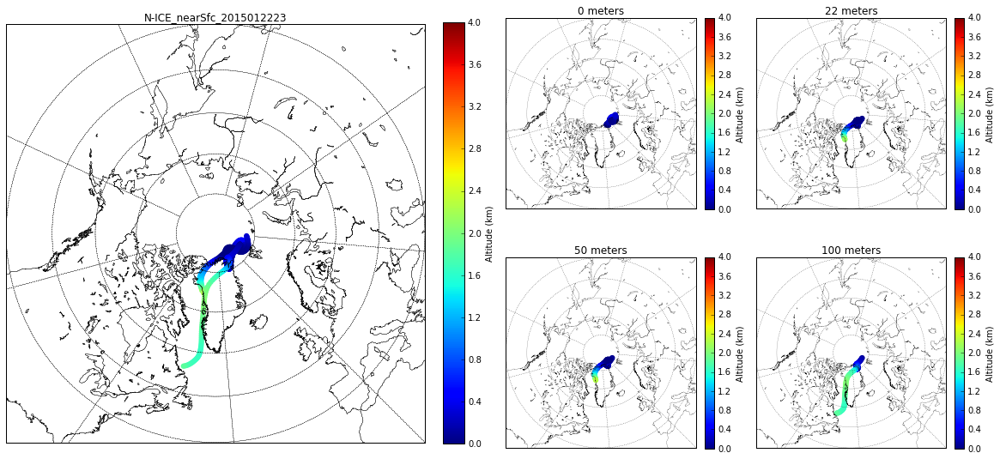

In [23]:
"""
Created on Sun Jun 19 20:44:22 2016

@author: pstar
"""

directory='/Users/pstar/Desktop/WSU REU/Project/N-ICE/HysplitData/'
plotDirectory='/Users/pstar/Desktop/WSU REU/Project/N-ICE/pyxPlots/'

from mpl_toolkits.basemap import Basemap
import numpy as np
import matplotlib.pyplot as plt

#from pylab import rcParams
#rcParams['figure.figsize'] = 10, 10

# Determine the number of back trajectories to read.
f = open(directory+'N-ICE_nearSfc_2015012223.trj', 'r')
[f.readline() for i in np.arange(4)] # skip 1st four lines.
N = int(f.readline().split()[0])

# Read in the trajectory data and create a data frame.
backtraj = np.loadtxt(directory+'N-ICE_nearSfc_2015012223.trj',skiprows=6+N)
            
# Create a nifty map.
fig=plt.figure(figsize=(20, 10))
ax=plt.subplot2grid((2,4),(0,0), colspan=2, rowspan=2)
for i in np.arange(N):
    m = Basemap(resolution='l',projection='npstere',boundinglat=40.,lon_0=-45.)
    m.drawmapboundary()
    m.drawcoastlines(linewidth=0.2)
    parallels = np.arange(40.,90,10.)
    meridians = np.arange(0.,360.,40.)
    m.drawparallels(parallels, linewidth=.3)
    m.drawmeridians(meridians, linewidth=.3)
    lon = backtraj[i::N,10]
    lat = backtraj[i::N, 9]
    alt = backtraj[i::N,11]
    x, y = m(lon, lat)
    #changed vmax=8 to vmax=4, to show better scale ~p.star
    cm=m.scatter(x, y, c=alt/1000., linewidths=0, vmin=0., vmax=4., s=40)
    
# ....Annotate plot.
cb=plt.colorbar(fraction=0.046, pad=0.04)
cb.set_label('Altitude (km)')
ax.set_title('N-ICE_nearSfc_2015012223')

locs=[(0,2),(0,3),(1,2),(1,3)]
# ....Plot each back trajectory
for i in np.arange(N):
    ax1=plt.subplot2grid((2,4),locs[i])
    m = Basemap(resolution='l',projection='npstere',boundinglat=40.,lon_0=-45.)
    m.drawmapboundary()
    m.drawcoastlines(linewidth=0.2)
    parallels = np.arange(40.,90,10.)
    meridians = np.arange(0.,360.,40.)
    m.drawparallels(parallels, linewidth=.3)
    m.drawmeridians(meridians, linewidth=.3)
    lon = backtraj[i::N,10]
    lat = backtraj[i::N, 9]
    alt = backtraj[i::N,11]
    x, y = m(lon, lat)
    #changed vmax=8 to vmax=4, to show better scale ~p.star
    cm=m.scatter(x, y, c=alt/1000., linewidths=0, vmin=0., vmax=4., s=40)
    
# ....Annotate plot.
    cb=plt.colorbar(fraction=0.046, pad=0.04)
    cb.set_label('Altitude (km)')
    ax1.set_title(str(int(alt[0]))+' meters')
fig.subplots_adjust(hspace=0.0001)

# ....Save plot.
#plt.savefig(plotDirectory+'N-ICE_nearSfc_2015011211'+'.png')
#plt.close('all')

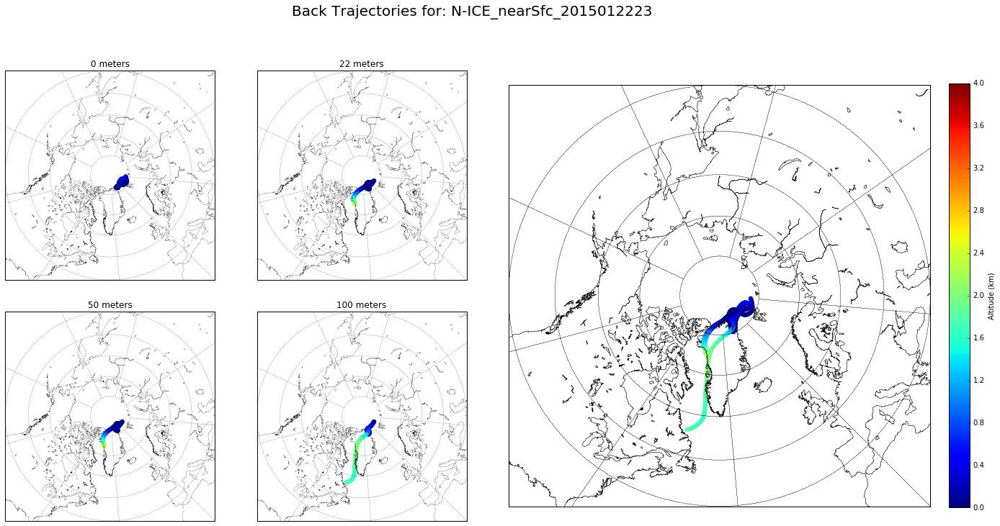

In [25]:
# -*- coding: utf-8 -*-
"""
Created on Sun Jun 19 20:44:22 2016

@author: pstar
"""
directory='/Users/pstar/Desktop/WSU REU/Project/N-ICE/HysplitData/'
plotDirectory='/Users/pstar/Desktop/WSU REU/Project/BackTraj/'

from mpl_toolkits.basemap import Basemap
import numpy as np
import matplotlib.pyplot as plt

#from pylab import rcParams
#rcParams['figure.figsize'] = 10, 10

# Determine the number of back trajectories to read.
f = open(directory+'N-ICE_nearSfc_2015012223.trj', 'r')
[f.readline() for i in np.arange(4)] # skip 1st four lines.
N = int(f.readline().split()[0])

# Read in the trajectory data and create a data frame.
backtraj = np.loadtxt(directory+'N-ICE_nearSfc_2015012223.trj',skiprows=6+N)
            
# Create a nifty map.
fig=plt.figure(figsize=(24, 12))

#ax.set_title('Back Trajectories for: N-ICE_nearSfc_2015012223')

locs=[(0,0),(0,1),(1,0),(1,1)]
# ....Plot each back trajectory
for i in np.arange(N):
    ax1=plt.subplot2grid((2,4),locs[i])
    m = Basemap(resolution='l',projection='npstere',boundinglat=40.,lon_0=-45.)
    m.drawmapboundary()
    m.drawcoastlines(linewidth=0.2)
    parallels = np.arange(40.,90,10.)
    meridians = np.arange(0.,360.,40.)
    m.drawparallels(parallels, linewidth=.3)
    m.drawmeridians(meridians, linewidth=.3)
    lon = backtraj[i::N,10]
    lat = backtraj[i::N, 9]
    alt = backtraj[i::N,11]
    x, y = m(lon, lat)
    #changed vmax=8 to vmax=4, to show better scale ~p.star
    cm=m.scatter(x, y, c=alt/1000.,linewidths=0, vmin=0., vmax=4., s=40)
    
# ....Annotate plot.
    #cb=plt.colorbar(fraction=0.046, pad=0.04)
    #cb.set_label('Altitude (km)')
    ax1.set_title(str(int(alt[0]))+' meters')
    
ax=plt.subplot2grid((2,4),(0,2), colspan=2, rowspan=2)
for i in np.arange(N):
    m = Basemap(resolution='l',projection='npstere',boundinglat=40.,lon_0=-45.)
    m.drawmapboundary()
    m.drawcoastlines(linewidth=0.2)
    parallels = np.arange(40.,90,10.)
    meridians = np.arange(0.,360.,40.)
    m.drawparallels(parallels, linewidth=.3)
    m.drawmeridians(meridians, linewidth=.3)
    lon = backtraj[i::N,10]
    lat = backtraj[i::N, 9]
    alt = backtraj[i::N,11]
    x, y = m(lon, lat)
    #changed vmax=8 to vmax=4, to show better scale ~p.star
    cm=m.scatter(x, y, c=alt/1000., linewidths=0, vmin=0., vmax=4., s=40)
    
# ....Annotate plot.
cb=plt.colorbar(fraction=0.046, pad=0.04)
cb.set_label('Altitude (km)')

fig.subplots_adjust(hspace=0.0001)
#plt.tight_layout()
plt.suptitle('Back Trajectories for: N-ICE_nearSfc_2015012223', fontsize=20 )
# ....Save plot.
#plt.savefig(plotDirectory+'testPlot5'+'.png')
#plt.close('all')


In [ ]:
##Use this code to read text file of back trajectory file name list
#trajText=open(backTrajDirectory + 'BackTraj.txt', 'r')
#traj=trajText.read().splitlines()
#for line in traj:
    ## Determine the number of back trajectories to read.
    #f = open(directory+line, 'r')
    #[f.readline() for i in np.arange(4)] # skip 1st four lines.
    #N = int(f.readline().split()[0])
    
    ## Read in the trajectory data and create a data frame.
    #backtraj = np.loadtxt(directory+line,skiprows=6+N)

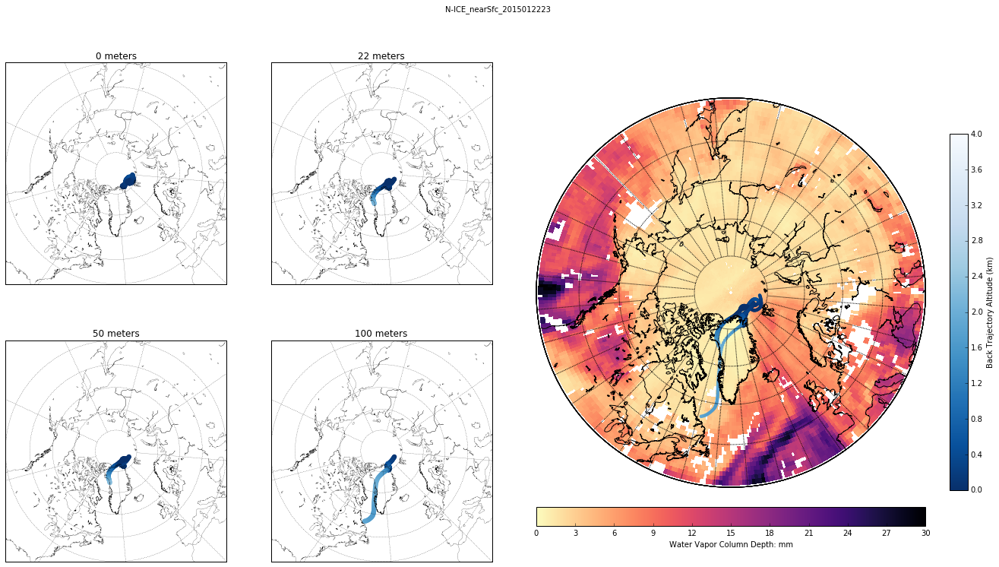

In [27]:
"""
Created on Sun Jun 19 21:10:37 2016

@author: pstar
"""

"""
Created on Sun Jun 19 20:44:22 2016

@author: pstar
"""

directory='/Users/pstar/Desktop/WSU REU/Project/N-ICE/HysplitData/'
plotDirectory='/Users/pstar/Desktop/WSU REU/Project/BackTraj/BackTrajSubPlots/'
backTrajDirectory='/Users/pstar/Desktop/WSU REU/Project/BackTraj/'
#set the directory where text files are located
airsDirectory='/Users/pstar/Desktop/WSU REU/Project/AIRSdata/'

from netCDF4 import Dataset
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
import numpy as np

# Determine the number of back trajectories to read.
f = open(directory+'N-ICE_nearSfc_2015012223.trj', 'r')
[f.readline() for i in np.arange(4)] # skip 1st four lines.
N = int(f.readline().split()[0])

# Read in the trajectory data and create a data frame.
backtraj = np.loadtxt(directory+'N-ICE_nearSfc_2015012223.trj',skiprows=6+N)
            
# Create a map.
fig=plt.figure(figsize=(24, 12))

locs=[(0,0),(0,1),(1,0),(1,1)]
#Plot each back trajectory on individual plots, one for each starting altitude
for i in np.arange(N):
    ax1=plt.subplot2grid((2,4),locs[i])
    #Create a north pole map
    m = Basemap(resolution='l',projection='npstere',boundinglat=40.,lon_0=-45.)
    m.drawmapboundary()
    m.drawcoastlines(linewidth=0.2)
    parallels = np.arange(40.,90,10.)
    meridians = np.arange(0.,360.,40.)
    m.drawparallels(parallels, linewidth=.3)
    m.drawmeridians(meridians, linewidth=.3)
    lon = backtraj[i::N,10]
    lat = backtraj[i::N, 9]
    alt = backtraj[i::N,11]
    x, y = m(lon, lat)
    #changed vmax=8 to vmax=4, to show better scale ~p.star
    cm=m.scatter(x, y, c=alt/1000.,linewidths=0, vmin=0., vmax=4., s=40, cmap=plt.cm.Blues_r)
    
    #Title the plot with its starting altitude
    ax1.set_title(str(int(alt[0]))+' meters')

file = open(airsDirectory+'AIRStest.txt', 'r')

for line in file:
    #access data
    airs=Dataset(line)
    #pull the date out of file name
    date=line.split('/')
    date=date[8]
    date=date.split('.')
    #write date as month/day/year
    figDate=date[2]+'/'+date[3]+'/'+date[1]
    #remove slashes for saving file; otherwise computer gets confused
    fileDate=date[2]+date[3]+date[1]
    

#Superimpose all back trajectories onto one larger plot    
    ax=plt.subplot2grid((2,4),(0,2), colspan=2, rowspan=2)

    lats = airs.variables['Latitude'][:] 
    lons = airs.variables['Longitude'][:]
    #slice the variables to the required latitude
    latbounds=[40, 90]
    lat_index = np.where((lats >= latbounds[0]) & (lats <= latbounds[1]))
    newLats=lats[lat_index]
    vap = airs.variables['TotH2OVap_TqJ_D'][lat_index]
    
    # Make a north pole basemap
    m = Basemap(resolution='l',projection='npstere',boundinglat=40.,lon_0=-45., round=True)
    m.drawmapboundary()
    m.drawcoastlines()
    parallels = np.arange(40.,81,10.)
    meridians = np.arange(0.,360.,10.)
    m.drawparallels(parallels)
    m.drawmeridians(meridians)
    x,y=np.meshgrid(lons, newLats)
    px,py=m(x,y)
    
    #plot latitude and longitude vs water vapor
    #color options: viridis_r, magma_r, plasma_r, inferno_r
    cs=m.pcolormesh(px,py,vap,vmin=0, vmax=30,cmap=plt.cm.magma_r)
    
    # add colorbar.
    cbar = m.colorbar(location='bottom',pad="5%")
    cbar.set_label('Water Vapor Column Depth: mm')
    # add title: 'Daily Water Vapor' or '8-Day Composite Water Vapor'
    #plt.title('Daily Water Vapor: '+figDate)
 
#plot back trajectory

    # Determine the number of back trajectories to read.
    f = open(directory+'N-ICE_nearSfc_2015012223.trj', 'r')
    [f.readline() for i in np.arange(4)] # skip 1st four lines.
    N = int(f.readline().split()[0])
    
    # Read in the trajectory data and create a data frame.
    backtraj = np.loadtxt(directory+'N-ICE_nearSfc_2015012223.trj',skiprows=6+N)
                
    
    # Plot each back trajectory onto water vapor map
    for i in np.arange(N):
        lon = backtraj[i::N,10]
        lat = backtraj[i::N, 9]
        alt = backtraj[i::N,11]
        x, y = m(lon, lat)
        #changed vmax=8 to vmax=4, to show better scale ~p.star
        cs2=m.scatter(x, y, c=alt/1000., cmap=plt.cm.Blues_r, linewidths=0, vmin=0., vmax=4., s=20)
        
    
    #Set back trajectory colorbar
    cb=plt.colorbar(shrink=0.7)
    cb.set_label('Back Trajectory Altitude (km)')
    
plt.suptitle('N-ICE_nearSfc_2015012223' )
    # save plot.
#plt.savefig(backTrajDirectory+'BackTrajWaterVapTest2.png')
    #plt.close('all')

## 20 June 2016

### Water Vapor Plots
Adjusted title and colorbar labels for water vapor plots, and re-generated plots for 8-day composites and daily water vapor. Plots are still sometimes coming up with white spaces. Googling has provided no useful information or fixes. Need to check in with Dr. Walden.

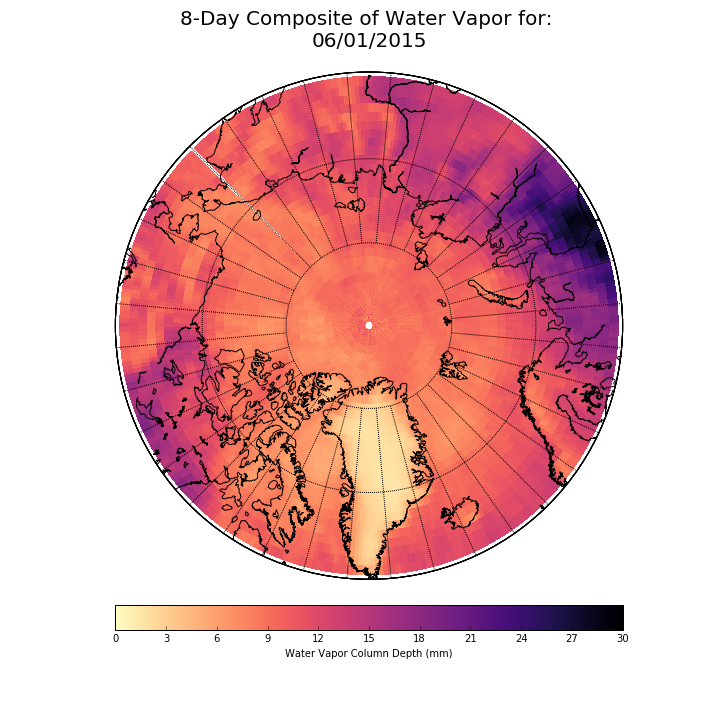

In [5]:
from IPython.display import Image, display
display(Image('/Users/pstar/Desktop/WSU REU/Project/AIRSplots/N-ICE_8/06012015.png'))

### Back Trajectory Overlays
Created some sample overlay subplots to try to determine best colormap for back trajectories. The first sample plot shown is with the plasma colormap, the second with the inferno colormap. Decided to run backtrajectories with plasma colormap.

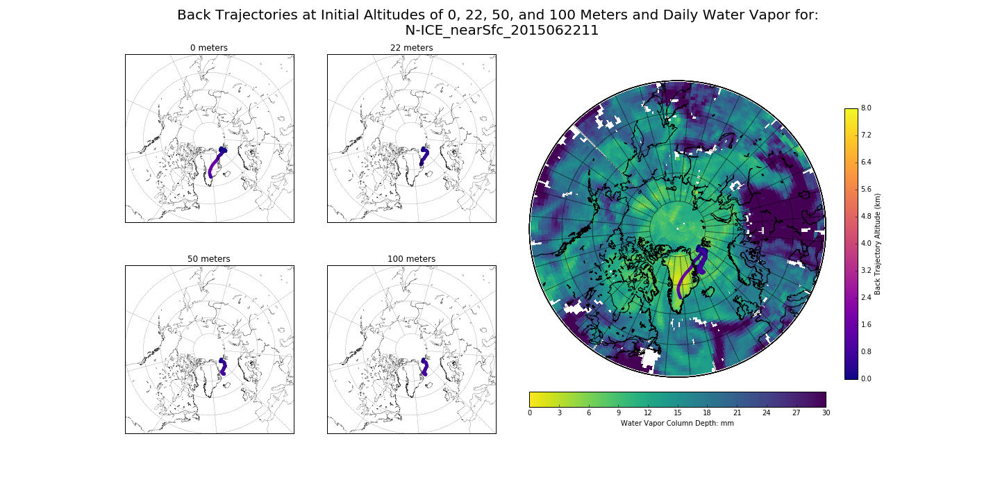

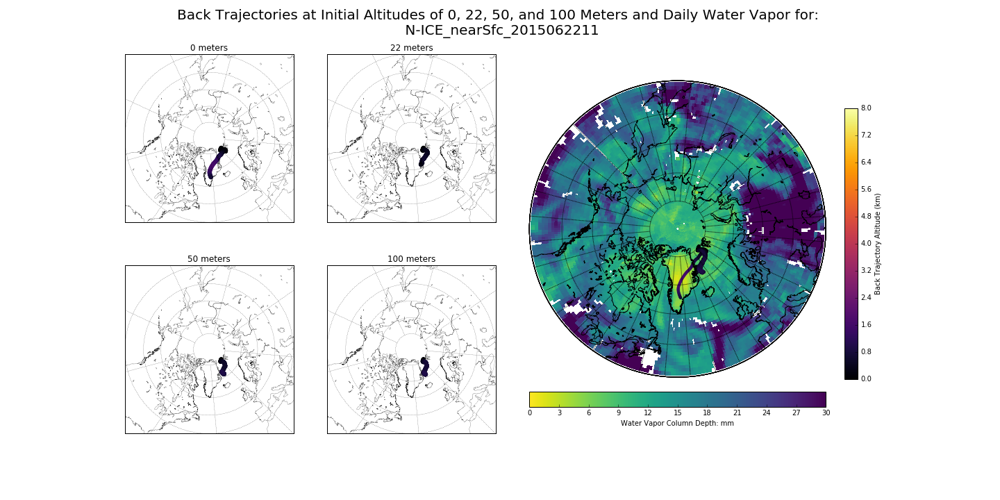

In [3]:
from IPython.display import Image, display
display(Image('/Users/pstar/Desktop/WSU REU/Project/BackTraj/BackTrajWaterVapTest3.png'))
display(Image('/Users/pstar/Desktop/WSU REU/Project/BackTraj/BackTrajWaterVapTest4.png'))

Adjusted colormap scale back to vmax=8.

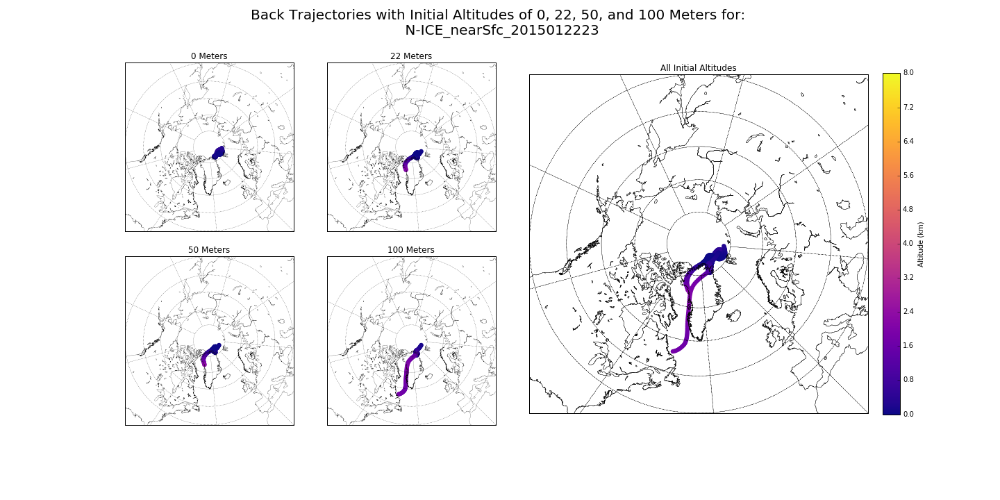

In [6]:
from IPython.display import Image, display
display(Image('/Users/pstar/Desktop/WSU REU/Project/BackTraj/testPlot5.png'))

### Questions for Dr. Walden
Blank spaces on water vapor plots.  
Overlay colors.  
Overlay dates/times.  
Overlay subplots. 



### Animation link: 
http://stackoverflow.com/questions/18797175/animation-with-pcolormesh-routine-in-matplotlib-how-do-i-initialize-the-data


https://codedump.io/share/P5ek4lrwL2LR/1/contourf-and-quiver-animation-with-basemap-python

## 21 June 2015

### Animations

An option is to use matplotlib.animation. A problem with this is that it doesn't work will with mac osx. Can be made to work by changing python backend to Tkagg.

https://jakevdp.github.io/blog/2012/08/18/matplotlib-animation-tutorial/

https://github.com/matplotlib/basemap/blob/master/examples/animate.py

https://codedump.io/share/P5ek4lrwL2LR/1/contourf-and-quiver-animation-with-basemap-python

http://stackoverflow.com/questions/18016390/save-matplotlib-animation

### Animation Code
This code is currently not working; it is generating a blank graph.

"""
Created on Mon Jun 20 11:39:22 2016

@author: pstar
"""


from netCDF4 import Dataset
from mpl_toolkits.basemap import Basemap
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

#airs = Dataset('http://acdisc.sci.gsfc.nasa.gov/opendap/hyrax/Aqua_AIRS_Level3/AIRX3STD.006/2015/AIRS.2015.03.28.L3.RetStd001.v6.0.31.0.G15187101630.hdf')
#lats = airs.variables['Latitude'][:] 
#lons = airs.variables['Longitude'][:]
#vap = airs.variables['TotH2OVap_TqJ_D'][...]

##try generating an initial graph and then updating
directory='/Users/pstar/Desktop/WSU REU/Project/AIRSdata/'
#open a text file
file = directory+'AIRStest.txt'
lines=open(file).read().splitlines()
i=len(lines)
    
fig=plt.figure()
m = Basemap(resolution='l',projection='npstere',boundinglat=60.,lon_0=-45., round=True)
m.drawmapboundary()
m.drawcoastlines()
parallels = np.arange(60.,81,10.)
meridians = np.arange(0.,360.,10.)
m.drawparallels(parallels)
m.drawmeridians(meridians)

airs=Dataset(lines[0])
lats = airs.variables['Latitude'][:] 
lons = airs.variables['Longitude'][:]
#slice the variables to the required latitude
latbounds=[59, 90]
lat_index = np.where((lats >= latbounds[0]) & (lats <= latbounds[1]))
newLats=lats[lat_index]

x,y=np.meshgrid(lons, newLats)
px,py=m(x,y)

quad,=m.pcolormesh(px,py,[],vmin=0, vmax=30,cmap=plt.cm.viridis_r)
cbar = m.colorbar(quad,location='bottom',pad="5%")
cbar.set_label('Water Vapor Column Depth (mm)')
txt=plt.title()

def init():
    quad.set_data([])
    return quad,

def animate(i):
    line=lines[i]
    #access data
    airs=Dataset(line)
    #pull the date out of file name
    date=line.split('/')
    date=date[8]
    date=date.split('.')
    #write date as month/day/year
    figDate=date[2]+'/'+date[3]+'/'+date[1]
    #remove slashes for saving file; otherwise computer gets confused
    #fileDate=date[2]+date[3]+date[1]
    vap = airs.variables['TotH2OVap_TqJ_D'][lat_index]
    
    txt.set_text('Daily Water Vapor for: \n' + figDate, y=1.04, fontsize=20)
    quad.set_data(vap)
    
    return quad,
    
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=i-1, interval=20, blit=False)
plt.show()


### Meeting with Dr. Walden
Change AIRS colormap units from mm to cm  
Use addcyclic to get rid of the white line on plots  
Maybe cap water vapor to smaller values, or use a logarithmic color scale, or zoom in more on N-ICE region  
Try downloading nedCDF files to machine to see if that helps with white spaces

Get into aeolus and generate back trajectories at 3000, 5500, 5800, and 6000 m  
Compare for altitude sensitivity test
Go back 10 days, once per day at 0000 UT  



## 22 June 2016

### Animation!
Have successfully completed code to generate water vapor mp4. Still needs modifications: switch units to cm and deal with white spaces. Also might run more quickly if I modify code so that it deletes earlier plots/data as it goes. 

### Save as movie
Links: http://ericholsinger.com/general/install-ffmpeg-on-a-mac/

http://louistiao.me/posts/notebooks/embedding-matplotlib-animations-in-jupyter-notebooks/

http://stackoverflow.com/questions/34801611/embed-video-into-axessubplot-on-jupyter-ipython-notebook

In [2]:
import io
import base64
from IPython.display import HTML

video = io.open('/Users/pstar/Desktop/WSU REU/Project/AIRSmovies/vapor2.mp4', 'r+b').read()
encoded = base64.b64encode(video)

HTML(data='''<video alt="test" controls> 
     <source src="data:video/mp4;base64,{0}" type="video/mp4" />
     </video>'''.format(encoded.decode('ascii')))


Changed scale to cm and sent video to Dr. Walden and Sarah.

Trying to access MODIS data but having difficulty with the ftp transfer. Requested data from here: https://ladsweb.nascom.nasa.gov/data/search.html

Downloaded AIRS data as netCDF file to see if that would fix holes. It did not.

### Things I am trying to do
Get MODIS water vapor data. My brain is tied up in Linux knots trying to get this thing.   
Get into aeolus and generate hysplit back trajectories. Again, more Linux bullshit.  
So maybe for fun I make more water vapor movies.  
Or just read some back trajectory papers. 